### SMA Lab 9: Cascading behavior in networks

#### SWETHA JENIFER
#### 225229142

In [1]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import sys
import os
from __future__ import division
plt.rcParams["figure.figsize"] = (20,10)
from itertools import chain
import tqdm as tqdm
from colorthief import ColorThief
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [8]:
votes_data = pd.read_excel('ESC2018_GF.xlsx',sheet_name='Combined result')
print(votes_data.shape)
votes_data.head(5)

(26, 47)


,Rank,Running order,Country,Total,Albania,Austria,Belarus,Belgium,Croatia,Cyprus,...,Hungary,Moldova,Armenia,Czech Republic,Georgia,Montenegro,Azerbaijan,San Marino,Italy,Australia
0,1,22,Israel,529,6,19,8,16,16,10,...,16,22,18,22,15,1,13,24,9,18
1,2,25,Cyprus,436,20,1,15,11,8,0,...,7,13,19,8,10,6,14,7,8,7
2,3,5,Austria,342,2,0,10,15,0,2,...,11,3,7,5,9,0,0,0,7,5
3,4,11,Germany,340,14,16,0,7,3,3,...,1,8,5,3,7,0,5,14,13,12
4,5,26,Italy,308,24,10,4,6,10,15,...,6,8,3,2,5,12,5,12,0,0


In [9]:
votes_data.tail(5)

,Rank,Running order,Country,Total,Albania,Austria,Belarus,Belgium,Croatia,Cyprus,...,Hungary,Moldova,Armenia,Czech Republic,Georgia,Montenegro,Azerbaijan,San Marino,Italy,Australia
21,22,3,Slovenia,64,0,5,4,0,7,0,...,0,0,0,7,0,6,0,6,0,0
22,23,2,Spain,61,0,0,0,1,0,7,...,0,0,0,0,0,0,0,0,0,7
23,24,9,United Kingdom,48,3,0,0,0,2,0,...,0,0,0,0,0,2,0,1,6,6
24,25,17,Finland,46,0,0,0,0,0,0,...,0,0,0,3,0,0,0,0,0,4
25,26,8,Portugal,39,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Step2:Build the network out of the dataset

In [10]:
votes_melted = votes_data.melt(
 ['Rank','Running order','Country','Total'],
 var_name = 'Source Country',value_name='points')
votes_melted.head()

,Rank,Running order,Country,Total,Source Country,points
0,1,22,Israel,529,Albania,6
1,2,25,Cyprus,436,Albania,20
2,3,5,Austria,342,Albania,2
3,4,11,Germany,340,Albania,14
4,5,26,Italy,308,Albania,24


In [11]:
votes_melted = votes_data.melt(
 ['Rank','Running order','Country','Total'],
 var_name = 'Source Country',value_name='points')
votes_melted.head()

,Rank,Running order,Country,Total,Source Country,points
0,1,22,Israel,529,Albania,6
1,2,25,Cyprus,436,Albania,20
2,3,5,Austria,342,Albania,2
3,4,11,Germany,340,Albania,14
4,5,26,Italy,308,Albania,24


In [12]:
G = nx.from_pandas_edgelist(votes_melted, 
 source='Source Country',
target='Country',
edge_attr='points',
create_using=nx.DiGraph())

In [13]:
print(nx.info(G))

DiGraph with 43 nodes and 1118 edges


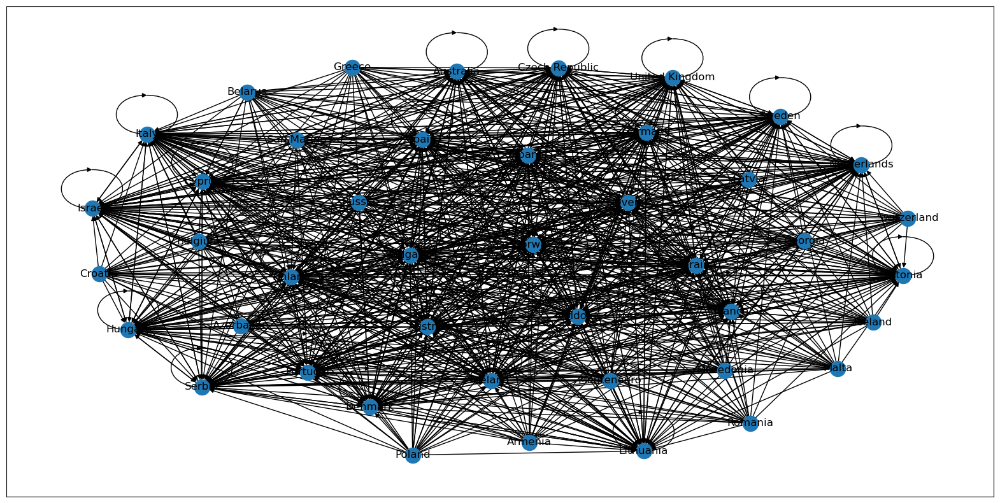

In [14]:
nx.draw_networkx(G)

#### Step3:Understand the concept of information diffusion

In [15]:
dataframe1 = pd.read_csv("countries.csv", encoding="ISO-8859-1")

In [16]:
import chardet

with open("countries.csv", "rb") as f:
    result = chardet.detect(f.read())
    encoding = result["encoding"]

dataframe1 = pd.read_csv("countries.csv", encoding=encoding)

In [17]:
countries = pd.read_csv('countries.csv', index_col='Country', encoding='ISO-8859-1')


In [18]:
with open("countries.csv", "rb") as f:
    content = f.read().decode("ISO-8859-1")  # Use the appropriate encoding here

# Process the content to remove or replace problematic characters
# Then create a StringIO object to read using pandas
from io import StringIO
countries = pd.read_csv(StringIO(content), index_col='Country')


In [19]:
countries.head()


,cc2,cc3,numeric,latitude,longitude
Country,,,,,
Afghanistan,AF,AFG,4,33.0000,65.0
Albania,AL,ALB,8,41.0000,20.0
Algeria,DZ,DZA,12,28.0000,3.0
American Samoa,AS,ASM,16,-14.3333,-170.0
Andorra,AD,AND,20,42.5000,1.6


In [20]:
pos_geo = { node: 
 ( max(-10,min(countries.loc[node]['longitude'],55)), # fixing scale
 max(countries.loc[node]['latitude'],25)) #fixing scale
 for node in G.nodes() }


In [21]:
pos_geo = {}
for node in G.nodes():pos_geo[node] = (
 max(-10,min(countries.loc[node]['longitude'],55)), # fixing scale
 max(countries.loc[node]['latitude'],25) #fixing scale
 )

In [22]:
flags = {}
flag_color = {}
for node in tqdm.tqdm_notebook(G.nodes()):
    flags[node] = 'flags/'+(countries.loc[node]['cc3']).lower().replace(' ','')+'.png' 
    flag_color[node] = ColorThief(flags[node]).get_color(quality=1)

  0%|          | 0/43 [00:00<?, ?it/s]

In [23]:
def RGB(red,green,blue): 
    return '#%02x%02x%02x' % (red,green,blue)

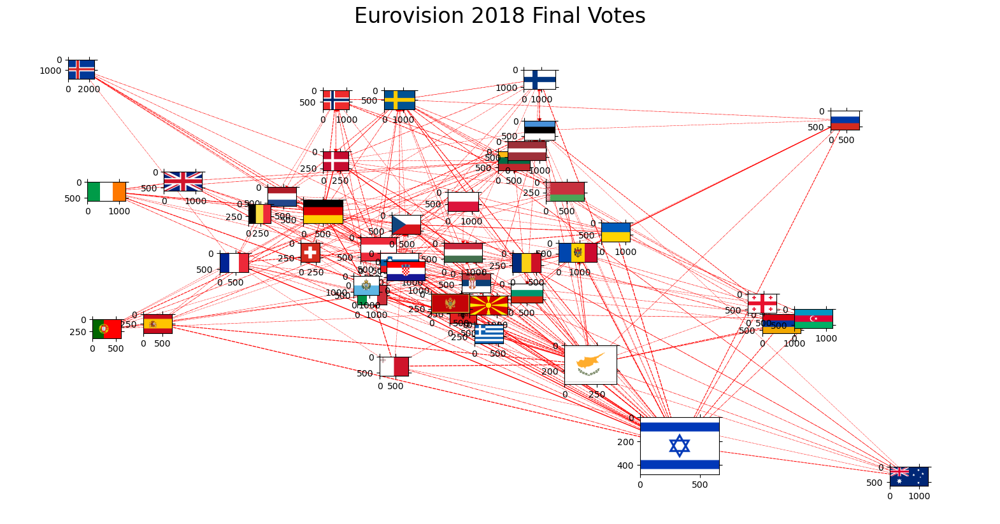

In [24]:
ax=plt.gca()
fig=plt.gcf()
plt.axis('off')
plt.title('Eurovision 2018 Final Votes',fontsize = 24)
trans = ax.transData.transform
trans2 = fig.transFigure.inverted().transform
tick_params = {'top':'off', 'bottom':'off', 'left':'off', 'right':'off','labelleft':'off', 'labelbottom':'off'} #flag grid params
styles = ['dotted','dashdot','dashed','solid'] # line styles
pos = pos_geo
 
# draw edges
for e in G.edges(data=True):
    width = e[2]['points']/24 #normalize by max points
    style=styles[int(width*3)]
    if width>0.3: #filter small votes
        
        RG = 'red'  # Replace 'red' with the actual color you want to use


        nx.draw_networkx_edges(G,pos,edgelist=[e],width=width, style=style, edge_color = RG)

 # in networkx versions >2.1 arrowheads can be adjusted
#draw nodes 
for node in G.nodes(): 

    imsize = max((0.3*G.in_degree(node,weight='points')

                  /max(dict(G.in_degree(weight='points')).values()))**2,0.03)
 
 # size is proportional to the votes
    flag = mpl.image.imread(flags[node])
    (x,y) = pos[node]
    xx,yy = trans((x,y)) # figure coordinates
    xa,ya = trans2((xx,yy)) # axes coordinates
    country = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize ])
    country.imshow(flag)
    country.set_aspect('equal')
    country.tick_params(**tick_params)
    fig.savefig('images/eurovision2018_map.png')

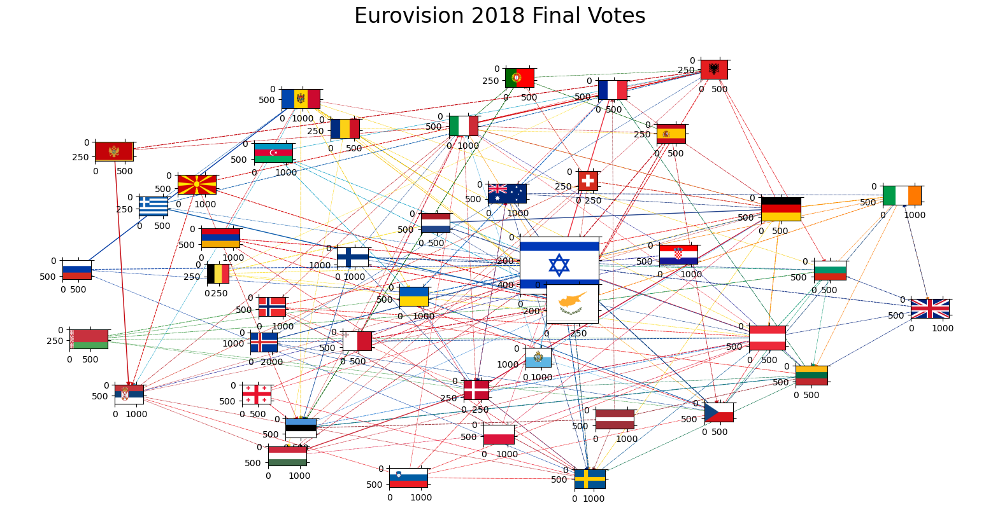

In [30]:
ax=plt.gca()
fig=plt.gcf()
plt.axis('off')
plt.title('Eurovision 2018 Final Votes',fontsize = 24)
pos = nx.layout.fruchterman_reingold_layout(G,k=1,weight = 'points',iterations=1000,scale =2)
trans = ax.transData.transform
trans2 = fig.transFigure.inverted().transform
tick_params = {'top':'off', 'bottom':'off', 'left':'off', 'right':'off','labelleft':'off', 'labelbottom':'off'} #flag grid params
styles = ['dotted','dashdot','dashed','solid'] # line styles
# draw edges
for e in G.edges(data=True):
    width = e[2]['points']/24
    style=styles[int(width*3)]
    if width>0.4:
        nx.draw_networkx_edges(G,pos,edgelist=[e],width=width, 
        style=style, edge_color = RGB(*flag_color[e[0]]) )
for node in G.nodes():
    imsize = max((0.3 * G.in_degree(node, weight='points') / max(dict(G.in_degree(weight='points')).values()))**2,0.03)
    flag = mpl.image.imread(flags[node])
    (x,y) = pos[node]
    xx,yy = trans((x,y)) # figure coordinates
    xa,ya = trans2((xx,yy)) # axes coordinates
    country = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize ])
    country.imshow(flag)
    country.set_aspect('equal')
    country.tick_params(**tick_params)
fig.savefig('images/eurovision2018_spring.png')

#### Step4:Build an indepent cascade model for the above network to illustrate the rumor spread dynamics

In [35]:
books = []
for i in range(5):
    books.append(pd.read_csv('asoiaf-book1-edges.csv'.format(i+1)))
all_books = pd.concat(books)
all_books.head()

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1


In [36]:
edges = all_books.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()
edges.sort_values('weight',ascending=False).head()


,Source,Target,weight
329,Eddard-Stark,Robert-Baratheon,1455
134,Bran-Stark,Robb-Stark,560
62,Arya-Stark,Sansa-Stark,520
249,Daenerys-Targaryen,Drogo,505
479,Joffrey-Baratheon,Sansa-Stark,435


In [37]:
edges = all_books.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()
edges.sort_values('weight',ascending=False).head()


,Source,Target,weight
329,Eddard-Stark,Robert-Baratheon,1455
134,Bran-Stark,Robb-Stark,560
62,Arya-Stark,Sansa-Stark,520
249,Daenerys-Targaryen,Drogo,505
479,Joffrey-Baratheon,Sansa-Stark,435


In [39]:
GOT = nx.from_pandas_edgelist(edges, 
 source='Source',
target='Target',
edge_attr='weight' )

In [40]:
print(nx.info(GOT))

Graph with 187 nodes and 684 edges


In [41]:
weighted_degrees = dict(nx.degree(GOT,weight='weight'))
max_degree = max(weighted_degrees.values())


In [42]:
subG = GOT.subgraph([n for n in weighted_degrees if weighted_degrees[n]>200])
print(nx.info(subG))


Graph with 64 nodes and 395 edges


In [43]:
pos = nx.spring_layout(subG,weight='weight',iterations=20, k = 4)

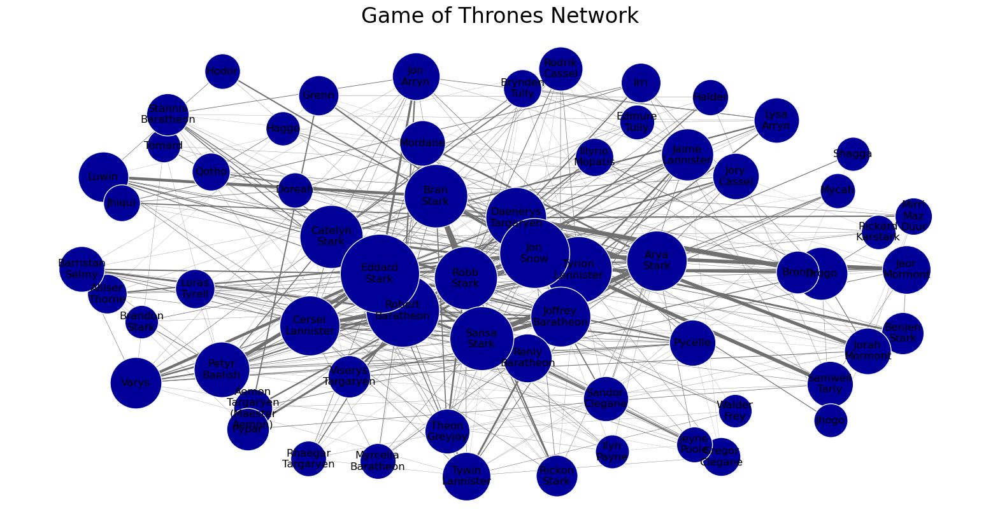

In [60]:
plt.axis('off')
plt.title('Game of Thrones Network',fontsize = 24)
threshold = 10 
for node in subG.nodes():
    size = 100*weighted_degrees[node]**0.5
    ns = nx.draw_networkx_nodes(subG, pos, nodelist=[node], node_size=size, node_color='#009f')
    ns.set_edgecolor('#f2f6fa')
nx.draw_networkx_labels(subG, pos, {n: n.replace('-', '\n') for n in subG.nodes() if weighted_degrees[node] > threshold})
for e in subG.edges(data=True):
    if e[2]['weight']>10:
        nx.draw_networkx_edges(subG,pos,[e],width=e[2]['weight']/100,edge_color='#707070')

In [61]:
infection_times = {}

In [62]:
def independent_cascade(G,t,infection_times):
    max_weight = max([e[2]['weight'] for e in G.edges(data=True)])
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    for n in current_infectious:
        for v in G.neighbors(n):
            if v not in infection_times:
                if G.get_edge_data(n,v)['weight'] >= np.random.random()*max_weight:
                    infection_times[v] = t+1
    return infection_times

In [73]:
def plot_G(G,pos,infection_times,t):
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    plt.figure()
    plt.axis('off')
    plt.title('Game of Thrones Network, t={}'.format(t),fontsize = 24)
    for node in G.nodes():
        size = 100*weighted_degrees[node]**0.5
        if node in current_infectious:
            ns = nx.draw_networkx_nodes(G, pos, nodelist=[node], node_size=size, node_color='pink')

        elif infection_times.get(node,9999999)<t:
                                        
            ns = nx.draw_networkx_nodes(G, pos, nodelist=[node], node_size=size, node_color='pink')

        else:
            ns = nx.draw_networkx_nodes(G, pos, nodelist=[node], node_size=size, node_color='pink')

        ns.set_edgecolor('#f2f6fa')
    nx.draw_networkx_labels(subG, pos, {n: n.replace('-', '\n') for n in subG.nodes() if weighted_degrees[node] > threshold})
    for e in G.edges(data=True):
        if e[2]['weight']>10:
            nx.draw_networkx_edges(G,pos,[e],width=e[2]['weight']/100,edge_color='#707070')

In [74]:
infection_times = {'Bran-Stark':-1,'Samwell-Tarly':-1,'Jon-Snow':0}

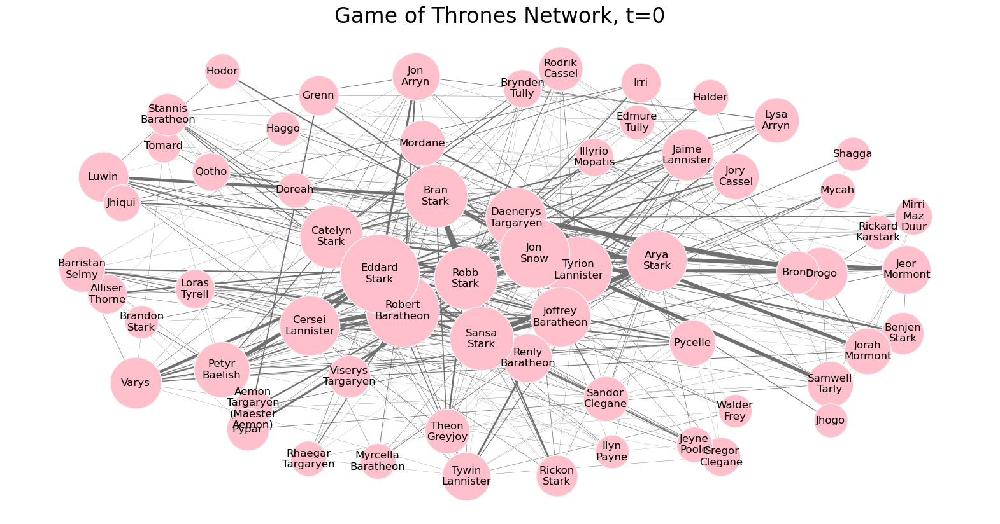

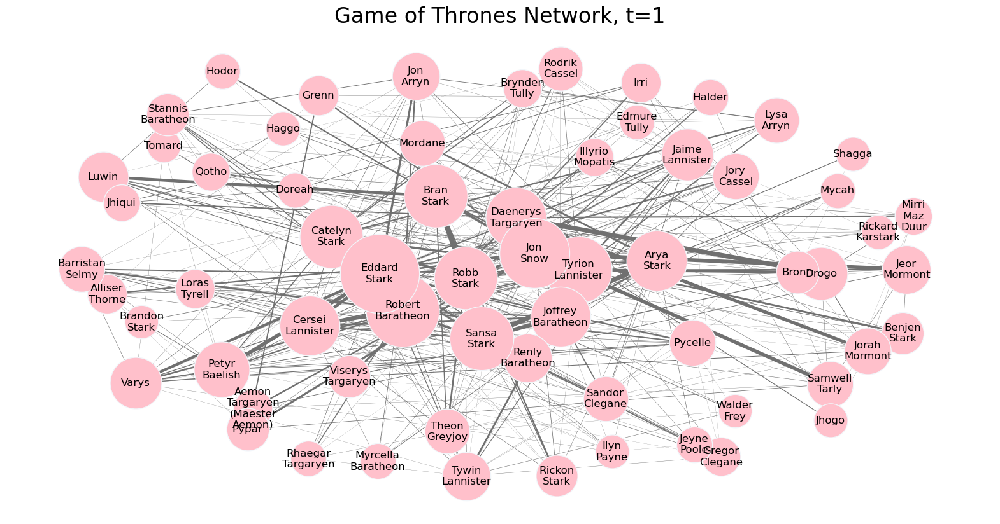

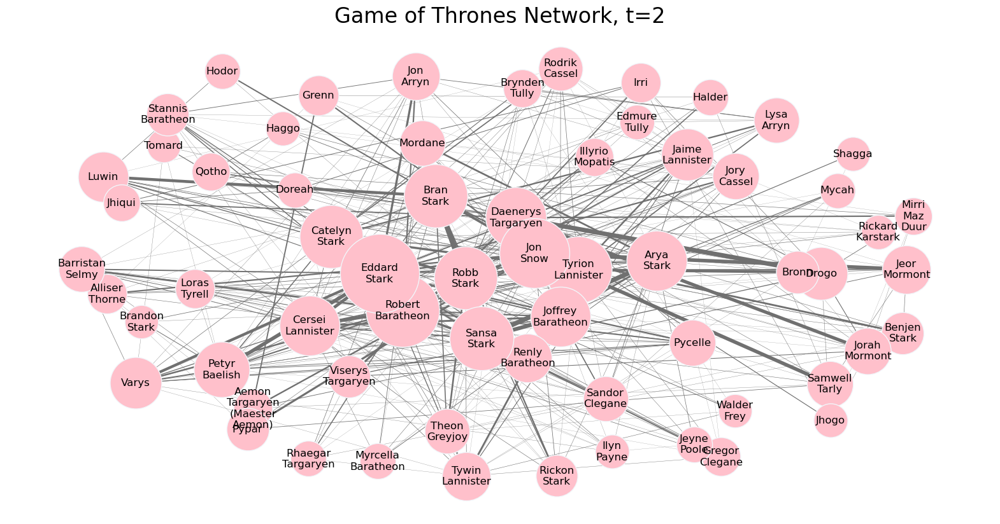

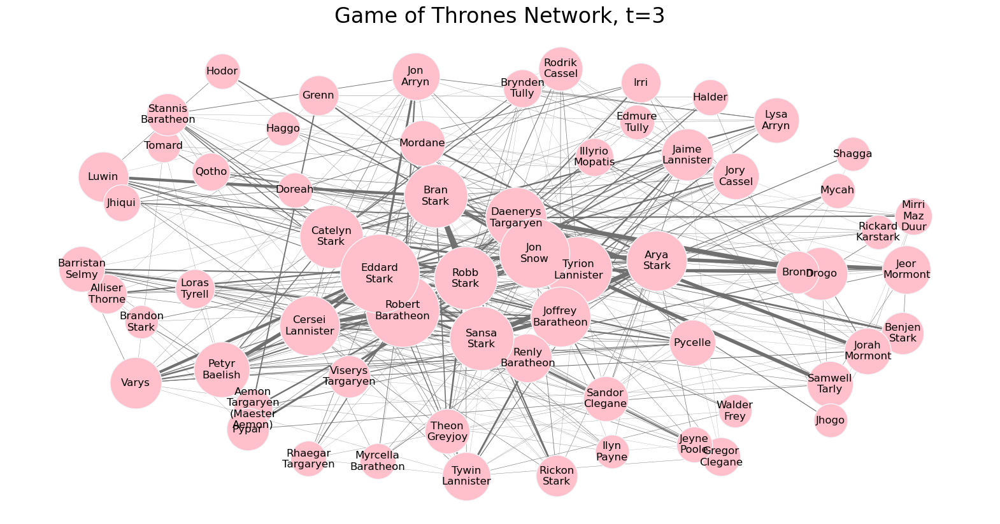

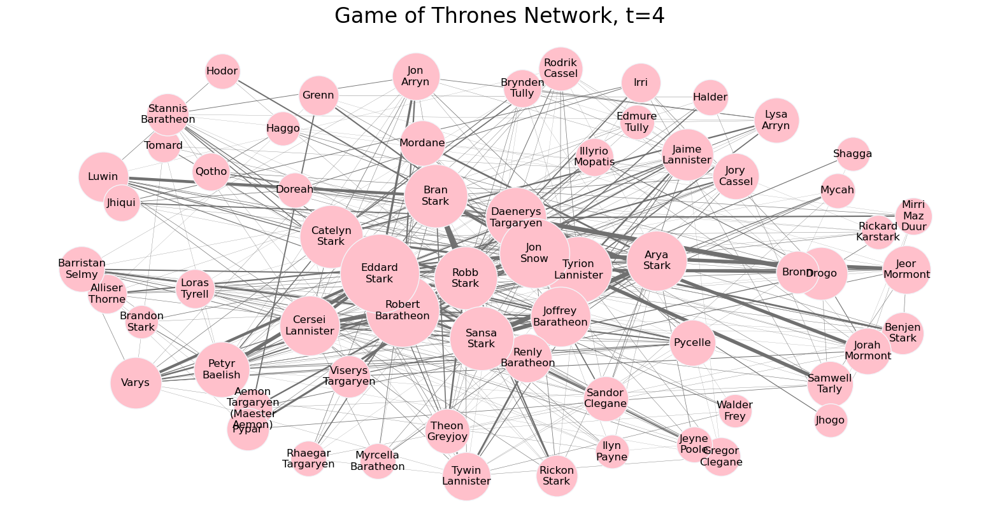

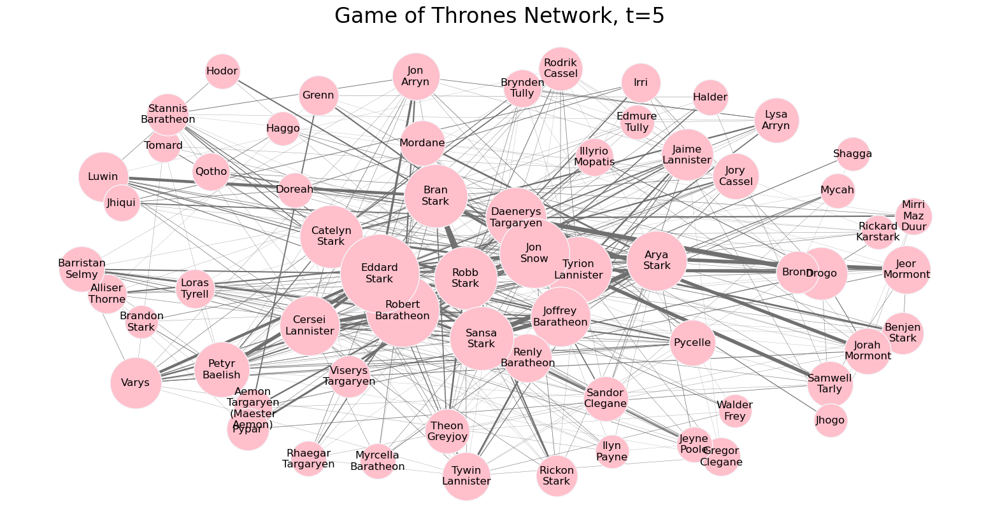

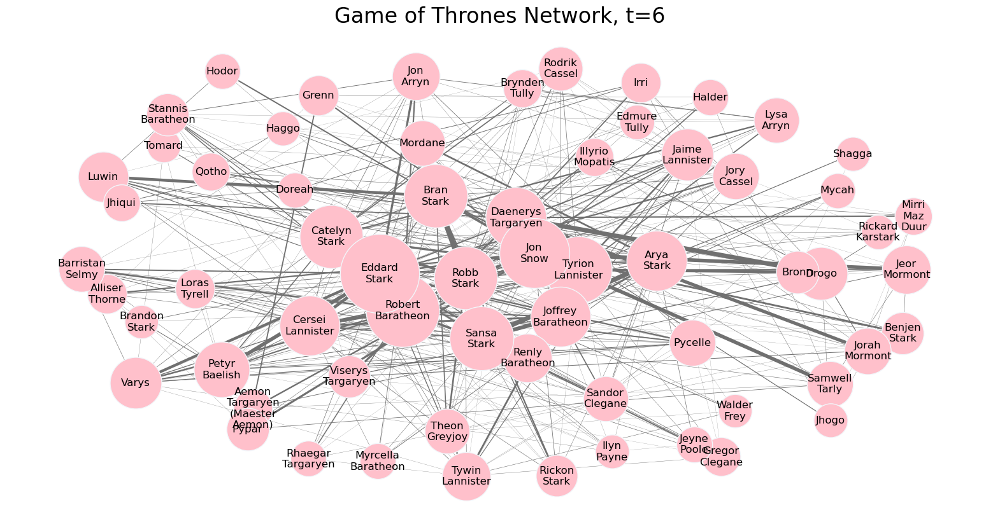

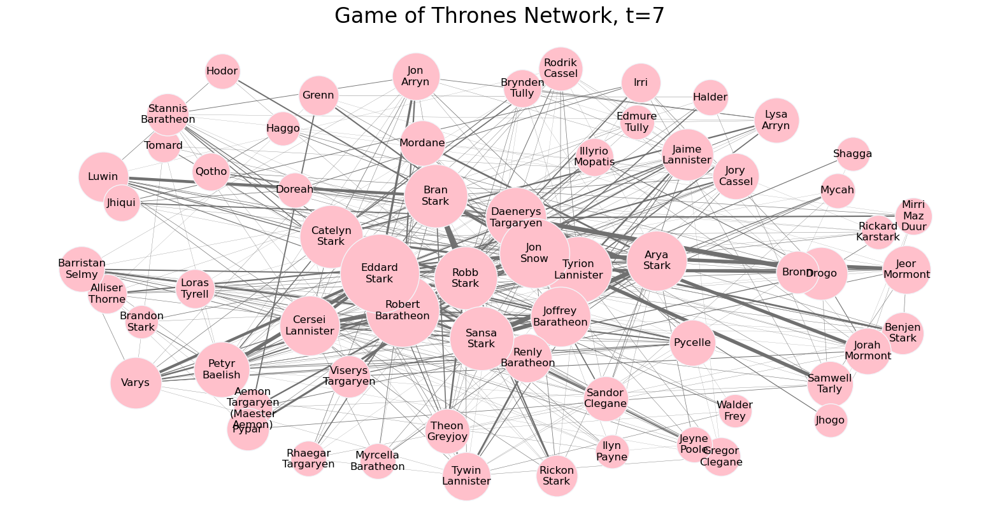

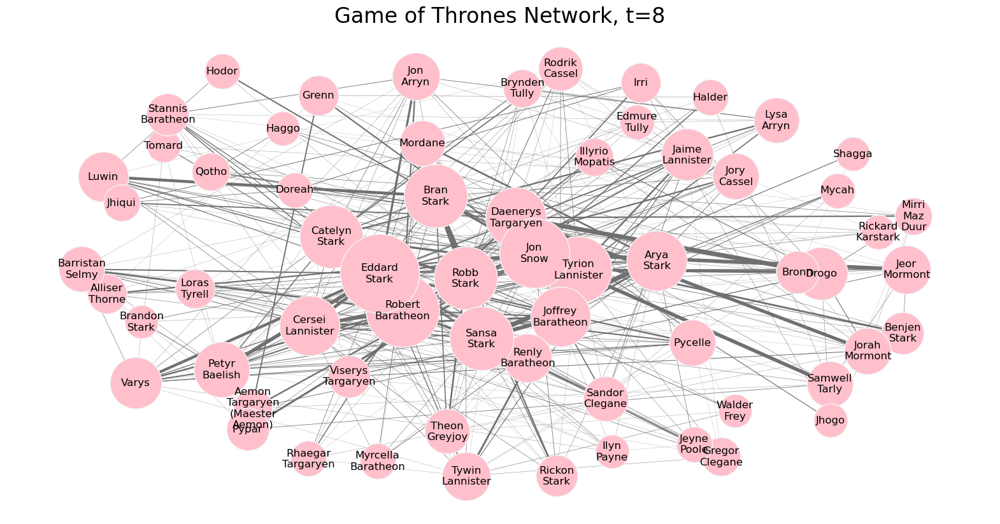

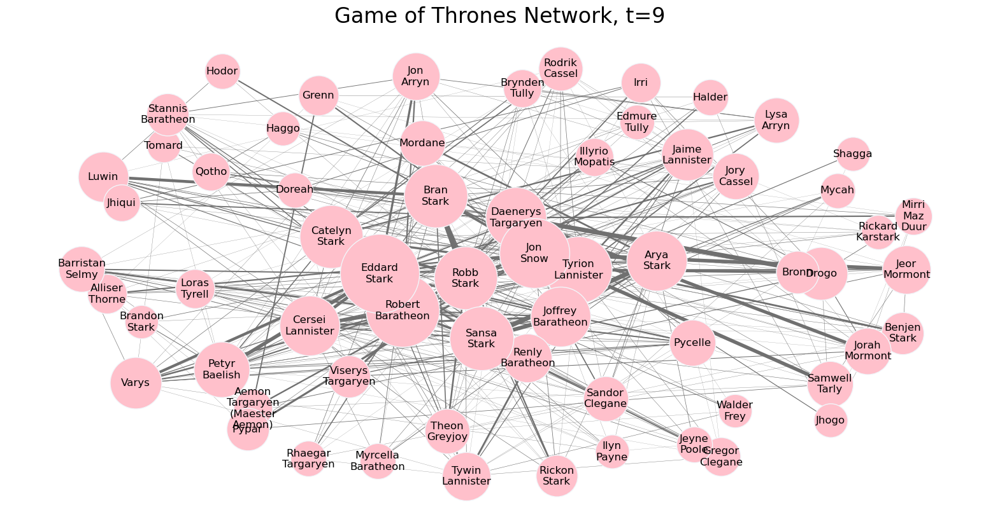

In [75]:
for t in range(10):
    plot_G(subG,pos,infection_times,t)
    infection_times = independent_cascade(subG,t,infection_times)

In [76]:
top = pd.DataFrame.from_dict(dict(nx.degree(subG)), orient='index').sort_values(0, ascending=False)
top.columns = ['Degree']
top['Weighted Degree'] = pd.DataFrame.from_dict(dict(nx.degree(subG, weight='weight')), orient='index')
top['PageRank'] = pd.DataFrame.from_dict(dict(nx.pagerank_numpy(subG, weight='weight')), orient='index')
top['Betweenness'] = pd.DataFrame.from_dict(dict(nx.betweenness_centrality(subG, weight='weight')), orient='index')


In [77]:
top.head()

,Degree,Weighted Degree,PageRank,Betweenness
Robert-Baratheon,37,4380,0.059347,0.299444
Eddard-Stark,37,5650,0.076334,0.034195
Sansa-Stark,29,2595,0.037554,0.077872
Tyrion-Lannister,28,2560,0.039245,0.080492
Joffrey-Baratheon,25,2000,0.028297,0.037213


In [78]:
methods = top.columns

In [80]:
max_budget = len(subG.nodes())
trials = 50
all_results = []
for budget in tqdm.tqdm_notebook(range(max_budget)):
    results = {'budget':budget}
    for method in methods:
        infections = []
        for i in range(trials):
            infected = 0
            t= 0
            infection_times = {n:0 for n in top.sort_values(method,ascending=False).index[:budget]}
            while len(infection_times)>infected:
                infected = len(infection_times)
                infection_times = independent_cascade(subG,t,infection_times)
                t+=1
            infections.append(infected)
        results[method] = np.round(np.mean(infections)/len(subG.nodes()),2)
    all_results.append(results)

  0%|          | 0/64 [00:00<?, ?it/s]

In [81]:
res_df = pd.concat([pd.DataFrame.from_dict(r,orient='index').T
for r in all_results]).set_index('budget')

In [82]:
res_df.index = res_df.index/len(subG.nodes())
res_df.head()

,Degree,Weighted Degree,PageRank,Betweenness
budget,,,,
0.000000,0.00,0.00,0.00,0.00
0.015625,0.19,0.19,0.18,0.18
0.031250,0.17,0.19,0.17,0.24
0.046875,0.22,0.22,0.22,0.26
0.062500,0.26,0.25,0.28,0.26


Text(0.5, 0, 'Seeding Budget (out of graph size)')

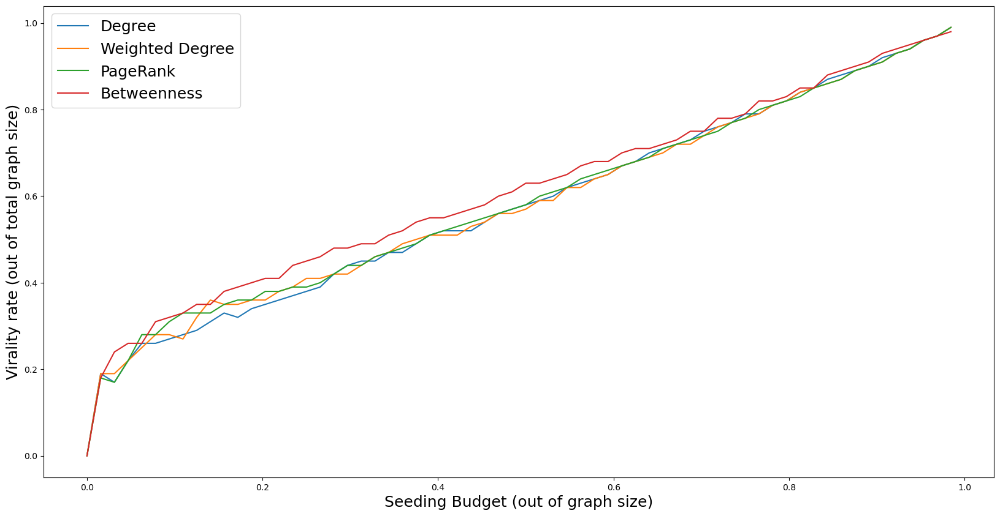

In [83]:
res_df.plot()
plt.legend(fontsize = 18)
plt.ylabel('Virality rate (out of total graph size)',fontsize = 18)
plt.xlabel('Seeding Budget (out of graph size)', fontsize = 18)